In [122]:
# Import necessary modules
from tvb.simulator.lab import *
from tvb.simulator.models.epileptor_rs import EpileptorRestingState
import numpy as np
import matplotlib.pyplot as plt
import time as tm
from scipy.signal import welch, hilbert, spectrogram

In [98]:
# Load Structural Connectivity Matrix
con = connectivity.Connectivity.from_file('/Users/mac/Downloads/tvb_data/tvb_data/connectivity/connectivity_76.zip')
nregions = len(con.region_labels)
con.weights = con.weights - con.weights * np.eye(nregions)  # Remove self-connections
con.speed = np.array([sys.float_info.max])  # Neglect conduction speed
con.configure()

2024-08-22 09:08:56,064 - WARNING - tvb.basic.readers - File 'hemispheres' not found in ZIP.


In [99]:
# Extract region labels
region_labels = con.region_labels

# Get the labels for the specific indices
selected_regions = region_labels[[62, 40, 47, 69, 72]]

# Display the selected regions
print("Selected brain regions:", selected_regions)

Selected brain regions: ['lPHC' 'lAMYG' 'lHC' 'lTCI' 'lTCV']


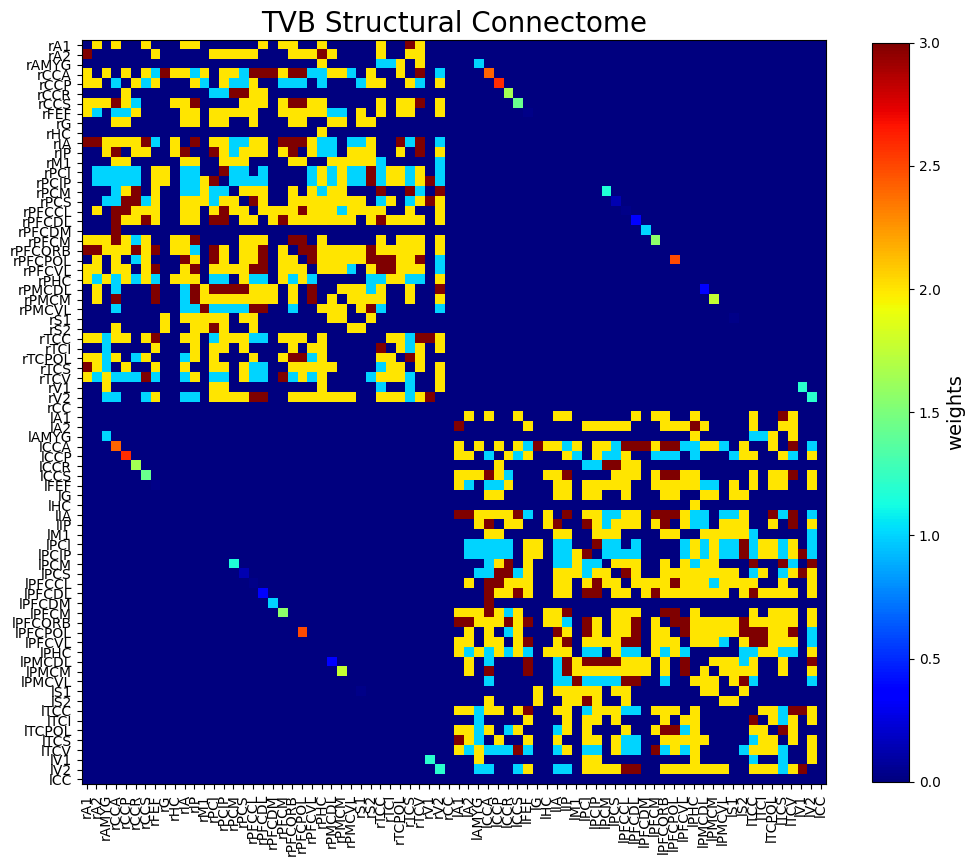

In [100]:
# Visualize the Structural Connectome
plt.figure(figsize=(12,12))
plt.imshow(con.weights, interpolation='nearest', aspect='equal', cmap='jet')
plt.title('TVB Structural Connectome', fontsize=20)
plt.xticks(range(0, nregions), con.region_labels, fontsize=10, rotation=90)
plt.yticks(range(0, nregions), con.region_labels, fontsize=10)
cb = plt.colorbar(shrink=0.8)
cb.set_label('weights', fontsize=14)
plt.show()

#plot 5 regions only

In [101]:
# if possible, plot electrode sites with selected regions before the epileptor is introduced

In [102]:
# Initialize the Hybrid Epileptor Model

mod = EpileptorRestingState(Ks=np.array([-0.1]), r=np.array([0.000015]), tau=np.array([1000]), K_rs=np.array([0.1]))
mod.a_rs = np.ones((nregions)) * (1.7402)

# Define Epileptogenic Network (EZ, PZ, NIZ)
mod.x0 = np.ones((nregions)) * (-2.3)  # NIZ
mod.x0[[40]] = np.ones((1)) * (-1.4)   # EZ: lAMYG
mod.x0[[47, 62]] = np.ones((2)) * (-1.6)  # EZ: lHC, lPHC
mod.x0[[69]] = np.ones((1)) * (-1.7)   # PZ: lTCI
mod.x0[[72]] = np.ones((1)) * (-1.8)   # PZ: lTCV

mod.bb = np.ones((nregions)) * (4)     # NIZ
mod.bb[[40, 47, 62]] = np.ones((3)) * (1)  # EZ
mod.bb[[69, 72]] = np.ones((2)) * (2)  # PZ

mod.p = np.ones((nregions)) * (0.1)    # NIZ
mod.p[[40, 47, 62]] = np.ones((3)) * (0.9)  # EZ
mod.p[[69, 72]] = np.ones((2)) * (0.7)  # PZ


In [103]:
#  Set up the Coupling Function
coupl = 1
con_coupling = coupling.Difference(a=np.array([coupl]))

In [104]:
# Initialize the Integrator (with Noise)
dt = 0.1  # Integration step size [ms]
nsigma1 = 0.00025  # Noise standard deviation for x2 and y2
nsigma2 = 0.001  # Noise standard deviation for x_rs

hiss = noise.Additive(nsig=np.array([0., 0., 0., nsigma1, nsigma1, 0., nsigma2, 0.]))
heunint = integrators.HeunStochastic(dt=dt, noise=hiss)

In [105]:
#  Define Monitors
mon_tavg = monitors.TemporalAverage(period=1)  # Monitor with 1ms period
what_to_watch = mon_tavg

In [106]:
# Set up the Simulator
sim = simulator.Simulator(model=mod,
                          connectivity=con,
                          conduction_speed=np.float64(con.speed),
                          coupling=con_coupling,
                          integrator=heunint,
                          monitors=[what_to_watch])
sim.configure()

# Run the Simulation
simulation_length = 60000  # Simulation length in ms
tic = tm.time()

tavg_time, tavg_data = [], []
for tavg in sim(simulation_length=simulation_length):
    if tavg is not None:
        tavg_time.append(tavg[0][0])
        tavg_data.append(tavg[0][1])

print(f'Simulation required {tm.time()-tic:.3f} seconds.')


/var/folders/v7/dbllwbmn3qv0sk0spbzgpd440000gn/T/ipykernel_4073/3426791091.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  conduction_speed=np.float64(con.speed),


Simulation required 69.179 seconds.


In [107]:
# Process and Visualize Simulation Results
tavg_data = np.squeeze(np.array(tavg_data))
tavg_data /= (np.max(tavg_data, 0) - np.min(tavg_data, 0))
tavg_data -= np.mean(tavg_data, 0)

# Compute LFP output model
DATA = mod.p[[0]] * tavg_data[:, 0, :] + (1 - mod.p[[0]]) * tavg_data[:, 2, :]

EZs = [62, 47, 40]
PZs = [69, 72]
for ie, ez in enumerate(EZs):
    DATA[:, EZs[ie]] = mod.p[[EZs[ie]]] * tavg_data[:, 0, EZs[ie]] + (1 - mod.p[[EZs[ie]]]) * tavg_data[:, 2, EZs[ie]]
for ip, pz in enumerate(PZs):
    DATA[:, PZs[ip]] = mod.p[[PZs[ip]]] * tavg_data[:, 0, PZs[ip]] + (1 - mod.p[[PZs[ip]]]) * tavg_data[:, 2, PZs[ip]]


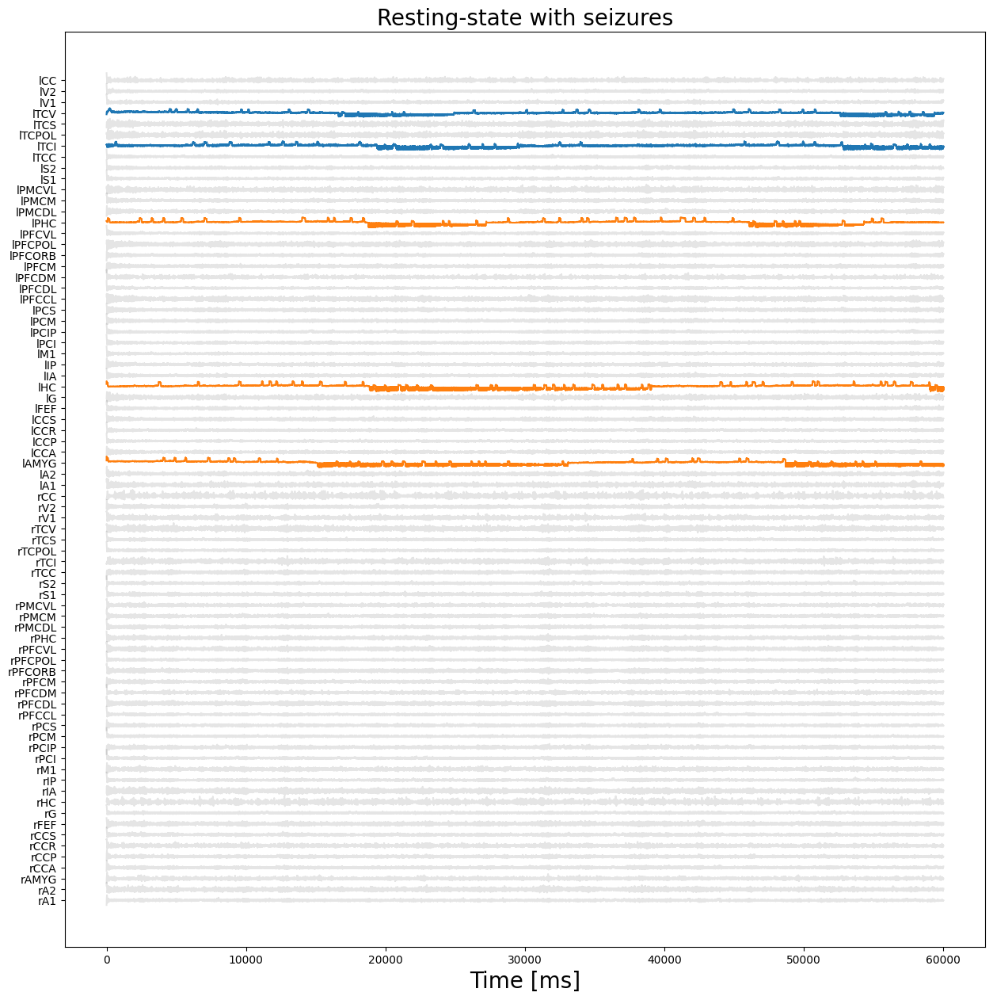

In [108]:
# Plot time series
plt.figure(figsize=(15,15))
plt.plot(DATA[:, :] + np.r_[:nregions], 'k', alpha=0.1)
plt.yticks(np.arange(len(con.region_labels)), con.region_labels, fontsize=10)

for ie, ez in enumerate(EZs):
    plt.plot(DATA[:, EZs[ie]] + EZs[ie], 'C1')
for ip, pz in enumerate(PZs):
    plt.plot(DATA[:, PZs[ip]] + PZs[ip], 'C0')

plt.title('Resting-state with seizures', fontsize=20)
plt.xlabel('Time [ms]', fontsize=20)
plt.show()

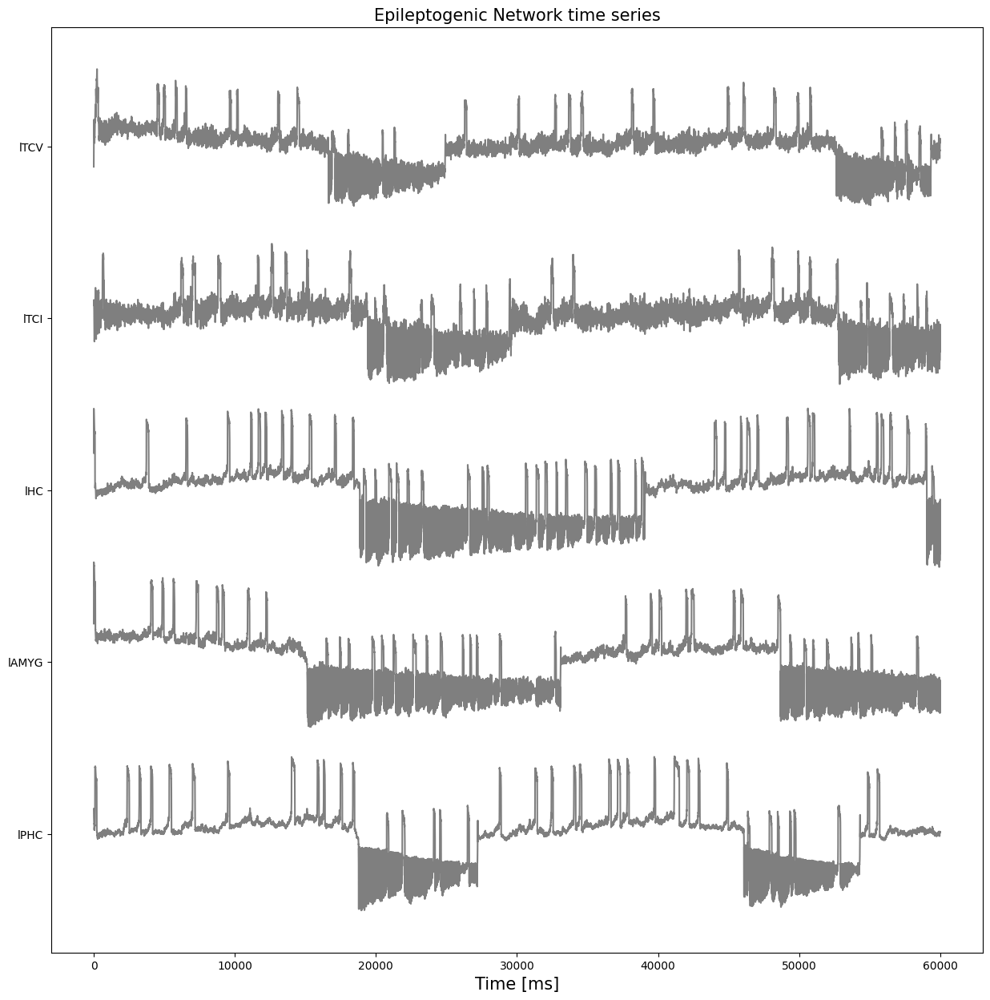

In [109]:
# Epileptogenic Network time series
EN = [62, 40, 47, 69, 72]
plt.figure(figsize=(15,15))
for ie, en in enumerate(EN):
    plt.plot(np.arange(0, 60000), DATA[0:60000, EN[ie]] + ie, 'k', alpha=0.5)
plt.title('Epileptogenic Network time series', fontsize=15)
plt.xlabel('Time [ms]', fontsize=15)
plt.yticks(np.arange(len(EN)), con.region_labels[EN])
plt.show()

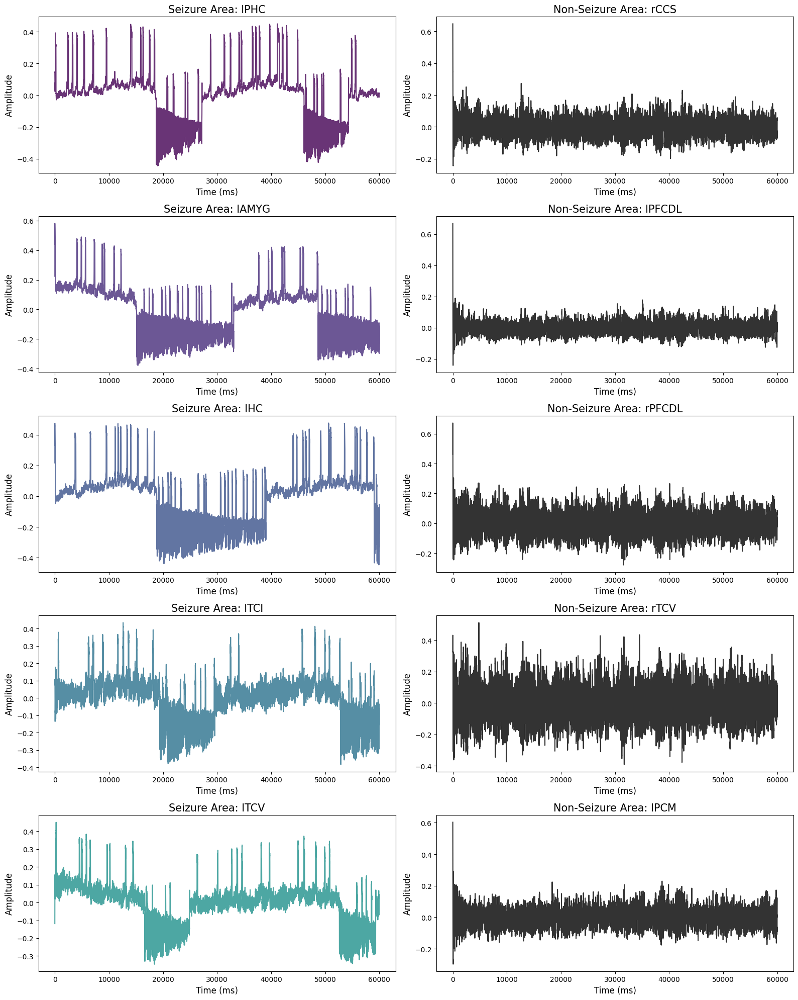

In [110]:

# Define the seizure regions and corresponding colors
seizure_regions = [62, 40, 47, 69, 72]
names = ['lPHC', 'lAMYG', 'lHC', 'lTCI', 'lTCV']
colors = plt.cm.viridis(np.linspace(0, .5, len(seizure_regions)))  # Use the same colormap as before

# Generate 5 random non-seizure regions that are not in the seizure list
nregions = DATA.shape[1]  # Assuming DATA is a 2D array where columns represent regions
all_regions = list(range(nregions))
non_seizure_regions = np.random.choice([r for r in all_regions if r not in seizure_regions], 5, replace=False)

# Create a figure with 2 columns and 5 rows
fig, axs = plt.subplots(5, 2, figsize=(16, 20))

# Plot each seizure region on the left side with corresponding colors
for i, (region_idx, color) in enumerate(zip(seizure_regions, colors)):
    axs[i, 0].plot(DATA[:, region_idx], color=color, alpha=0.8)
    axs[i, 0].set_title(f'Seizure Area: {names[i]}', fontsize=15)
    axs[i, 0].set_xlabel('Time (ms)', fontsize=12)
    axs[i, 0].set_ylabel('Amplitude', fontsize=12)

# Plot each non-seizure region on the right side with black color
for i, region_idx in enumerate(non_seizure_regions):
    axs[i, 1].plot(DATA[:, region_idx], 'k', alpha=0.8)
    axs[i, 1].set_title(f'Non-Seizure Area: {con.region_labels[region_idx]}', fontsize=15)
    axs[i, 1].set_xlabel('Time (ms)', fontsize=12)
    axs[i, 1].set_ylabel('Amplitude', fontsize=12)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

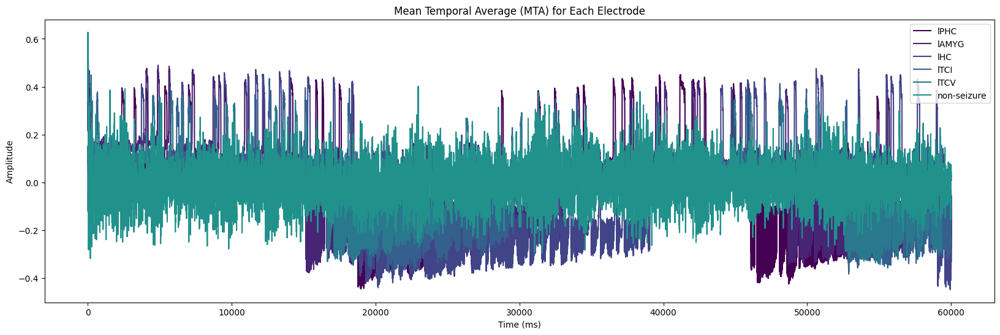

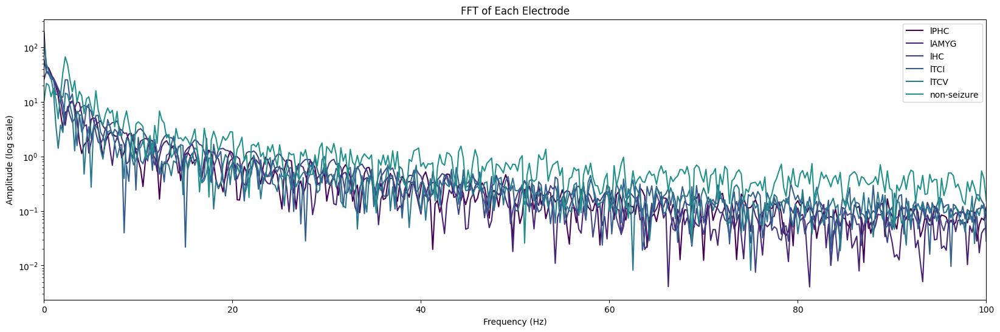

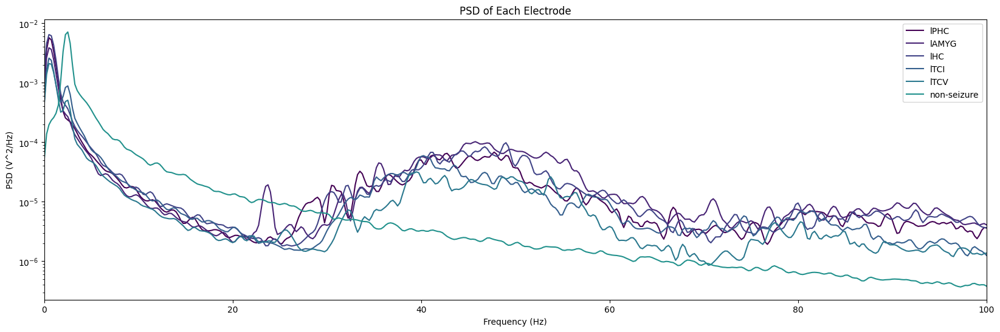

In [111]:
# Define the electrodes and their corresponding names
EN = [62, 40, 47, 69, 72, 1]
names = ['lPHC', 'lAMYG', 'lHC', 'lTCI', 'lTCV', 'non-seizure']
colors = plt.cm.viridis(np.linspace(0, .5, len(EN)))  # Use a colormap to generate distinct colors

# Plot Mean Temporal Average
plt.figure(figsize=(20, 6))
for idx, (en, name, color) in enumerate(zip(EN, names, colors)):
    # Extract the data for the current electrode
    electrode_data = DATA[:, en]
    plt.plot(np.arange(0, len(electrode_data)), electrode_data, color=color, label=name)

plt.title('Mean Temporal Average (MTA) for Each Electrode')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

# Plot FFT
plt.figure(figsize=(20, 6))
for idx, (en, name, color) in enumerate(zip(EN, names, colors)):
    # Extract the data for the current electrode
    electrode_data = DATA[:, en]

    # Perform FFT with higher resolution
    nfft = 2**10  # Using 1024 points for FFT for finer frequency resolution
    fft = np.fft.fft(electrode_data, n=nfft)
    freq = np.fft.fftfreq(nfft, d=1/256)

    # Filter to keep only frequencies between 0 and 100 Hz
    pos_freqs = (freq >= 0) & (freq <= 100)
    pos_freqs_fft = fft[pos_freqs]
    pos_freqs_freq = freq[pos_freqs]

    # Plot FFT of Mean Temporal Average
    plt.plot(pos_freqs_freq, np.abs(pos_freqs_fft), color=color, label=name)

plt.title('FFT of Each Electrode')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude (log scale)')
plt.yscale('log')  # Use logarithmic scale for amplitude
plt.xlim(0, 100)
plt.legend()
plt.show()

# Plot PSD
plt.figure(figsize=(20, 6))
for idx, (en, name, color) in enumerate(zip(EN, names, colors)):
    # Extract the data for the current electrode
    electrode_data = DATA[:, en]

    # Calculate the PSD using Welch's method with higher resolution
    freqs, psd = welch(electrode_data, fs=256, nperseg=nfft//2, noverlap=nfft//4, nfft=nfft)

    # Filter the PSD frequencies to 0-100 Hz
    psd_range = freqs <= 100
    freqs = freqs[psd_range]
    psd = psd[psd_range]

    # Plot PSD of Mean Temporal Average
    plt.semilogy(freqs, psd, color=color, label=name)

plt.title('PSD of Each Electrode')
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD (V^2/Hz)')
plt.xlim(0, 100)
plt.legend()
plt.show()

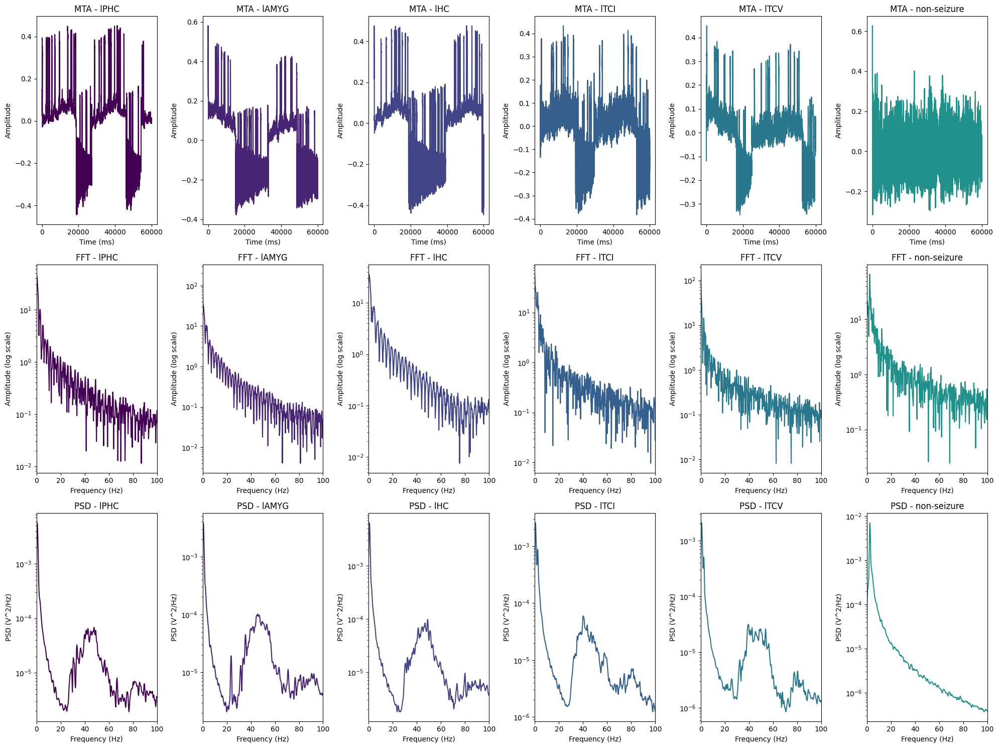

In [112]:
EN = [62, 40, 47, 69, 72, 1]
names = ['lPHC', 'lAMYG', 'lHC', 'lTCI', 'lTCV', 'non-seizure']
colors = plt.cm.viridis(np.linspace(0, .5, len(EN)))  # Use a colormap to generate distinct colors

plt.figure(figsize=(20, 15))

for idx, (en, name, color) in enumerate(zip(EN, names, colors)):
    # Extract the data for the current electrode
    electrode_data = DATA[:, en]

    # Perform FFT with higher resolution
    nfft = 2**10  # Using 1024 points for FFT for finer frequency resolution
    fft = np.fft.fft(electrode_data, n=nfft)
    freq = np.fft.fftfreq(nfft, d=1/256)

    # Filter to keep only frequencies between 0 and 100 Hz
    pos_freqs = (freq >= 0) & (freq <= 100)
    pos_freqs_fft = fft[pos_freqs]
    pos_freqs_freq = freq[pos_freqs]

    # Calculate the PSD using Welch's method with higher resolution
    freqs, psd = welch(electrode_data, fs=256, nperseg=nfft//2, noverlap=nfft//4, nfft=nfft)

    # Filter the PSD frequencies to 0-100 Hz
    psd_range = freqs <= 100
    freqs = freqs[psd_range]
    psd = psd[psd_range]

    # Plot Mean Temporal Average
    plt.subplot(3, len(EN), idx + 1)
    plt.plot(np.arange(0, len(electrode_data)), electrode_data, color=color)
    plt.title(f'MTA - {name}')
    plt.ylabel("Amplitude")
    plt.xlabel('Time (ms)')
  
    # Plot FFT of Mean Temporal Average (0-100 Hz)
    plt.subplot(3, len(EN), len(EN) + idx + 1)
    plt.plot(pos_freqs_freq, np.abs(pos_freqs_fft), color=color)
    plt.yscale('log')  # Use logarithmic scale for amplitude
    plt.xlim(0, 100)
    plt.title(f'FFT - {name}')
    plt.ylabel('Amplitude (log scale)')
    plt.xlabel('Frequency (Hz)')

    # Plot PSD of Mean Temporal Average (0-100 Hz)
    plt.subplot(3, len(EN), 2 * len(EN) + idx + 1)
    plt.semilogy(freqs, psd, color=color)
    plt.title(f'PSD - {name}')
    plt.xlim(0, 100)
    plt.ylabel('PSD (V^2/Hz)')
    plt.xlabel('Frequency (Hz)')

plt.tight_layout()
plt.show()

In [113]:
# Interactive Tool for Time Series Visualization
# ==================================================
import ipywidgets as widgets
from IPython.display import display

# Define the interactive plot function
def plot_time_series(region_idx):
    plt.figure(figsize=(12, 6))
    
    # Extract data for the selected region
    region_data = DATA[:, region_idx]
    
    # Plot the time series
    plt.plot(region_data, 'k', alpha=0.8)
    plt.title(f'Time Series Data for {con.region_labels[region_idx]}', fontsize=15)
    plt.xlabel('Time (ms)', fontsize=12)
    plt.ylabel('Amplitude', fontsize=12)
    plt.show()

# Define the interactive widget
region_selector = widgets.IntSlider(min=0, max=nregions-1, step=1, value=0, description='Region:')
widgets.interact(plot_time_series, region_idx=region_selector)

# Display the interactive widget
display(region_selector)


interactive(children=(IntSlider(value=0, description='Region:', max=75), Output()), _dom_classes=('widget-inte…

IntSlider(value=0, description='Region:', max=75)

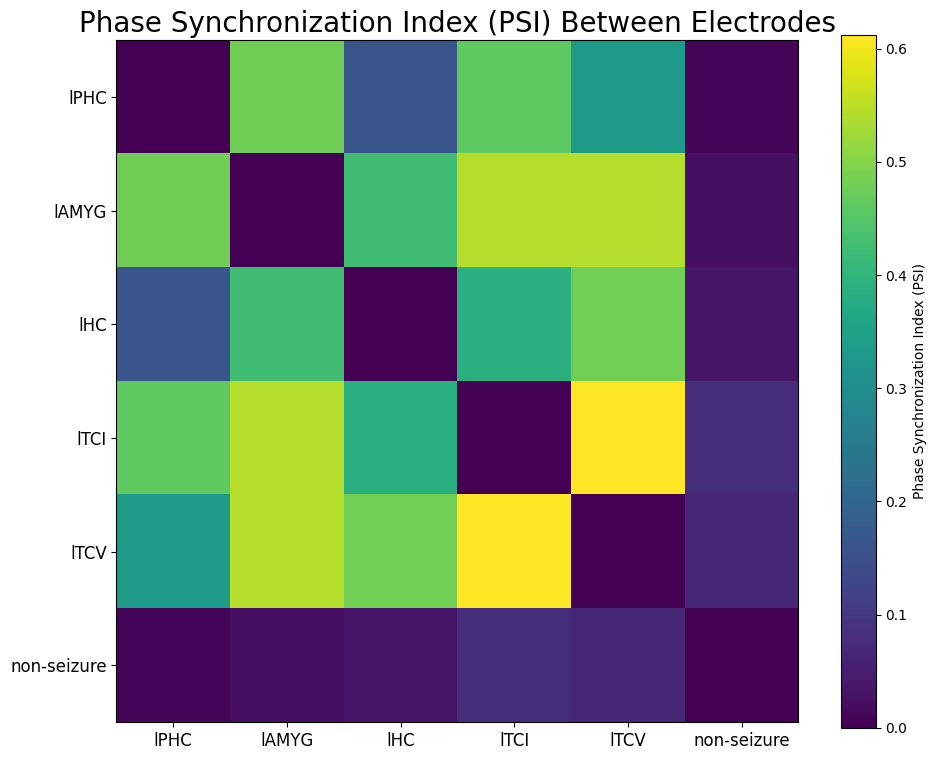

In [114]:
## band pass filter before PSI alpha (8-12), plot each one separately

##power for each window, separate into frequency bands --> heatmap, spectral signature (EZ vs. PZ)

## time x, y is frequency, color

# Extract the signals for the electrodes
electrode_signals = DATA[:, EN]

# Compute the analytic signal and phase for each electrode
analytic_signal = hilbert(electrode_signals, axis=0)
instantaneous_phase = np.angle(analytic_signal)

# Initialize the Phase Synchronization Index (PSI) matrix
psi_matrix = np.zeros((len(EN), len(EN)))

# Compute the PSI between each pair of electrodes
for i in range(len(EN)):
    for j in range(i+1, len(EN)):
        # Compute phase difference
        phase_diff = instantaneous_phase[:, i] - instantaneous_phase[:, j]
        # Compute PSI as the average of the cosine of the phase differences
        psi_matrix[i, j] = np.abs(np.mean(np.exp(1j * phase_diff)))
        psi_matrix[j, i] = psi_matrix[i, j]  # Symmetric matrix

# Visualize the PSI matrix as a heatmap
plt.figure(figsize=(11, 9))
plt.imshow(psi_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Phase Synchronization Index (PSI)')
plt.title('Phase Synchronization Index (PSI) Between Electrodes', fontsize=20)
plt.xticks(range(len(EN)), names, fontsize=12)
plt.yticks(range(len(EN)), names, fontsize=12)
plt.show()

before stimulation generate heatmap of power for each frequency band separated by frequency bands to find coherence, use band pass filtering to before phase synchronization with time windowing

iphc --> alpha, beta, gamma, separation time series plot and then y axis is and then compute mean power, window into one second windows /2/4/5, phase locking value of that


In [115]:
# Function to run simulations with varying onsets and intervals
def run_simulation(stimulus_onset, stimulus_interval):
    # Set up the stimulus with a pulse train
    eqn_t = equations.PulseTrain()
    eqn_t.parameters['onset'] = stimulus_onset
    eqn_t.parameters['T'] = stimulus_interval
    eqn_t.parameters['tau'] = 50.0

    stimulus = patterns.StimuliRegion(temporal=eqn_t, connectivity=con, weight=np.array([0.1]))
    stimulus.configure_space()
    stimulus.configure_time(np.arange(0., simulation_length, dt))

    # Reconfigure the simulator to include the stimulus
    sim = simulator.Simulator(
        model=mod,
        connectivity=con,
        coupling=con_coupling,
        integrator=heunint,
        monitors=[what_to_watch],
        stimulus=stimulus
    )
    sim.configure()

    # Run the simulation
    tavg_time, tavg_data = [], []
    for tavg in sim(simulation_length=simulation_length):
        if tavg is not None:
            tavg_time.append(tavg[0][0])
            tavg_data.append(tavg[0][1])

    return np.squeeze(np.array(tavg_data))


In [136]:
# Simulation parameters
simulation_length = 60000  # Simulation length in ms
dt = 0.1  # Integration step size [ms]

# Run simulations with varying onsets and intervals
onsets = [15000, 20000]
intervals = [5000, 1000]
results = {}

for onset in onsets:
    for interval in intervals:
        print(f"Running simulation with onset {onset} ms and interval {interval} ms...")
        sim_data = run_simulation(onset, interval)
        results[(onset, interval)] = sim_data

Running simulation with onset 15000 ms and interval 5000 ms...
2024-08-25 14:46:00,946 - ERROR - tvb.simulator.simulator - Bad Simulator.integrator.noise.nsig shape: (8, 1, 1)
Running simulation with onset 15000 ms and interval 1000 ms...
2024-08-25 14:47:28,286 - ERROR - tvb.simulator.simulator - Bad Simulator.integrator.noise.nsig shape: (8, 1, 1)
Running simulation with onset 20000 ms and interval 5000 ms...
2024-08-25 14:48:43,946 - ERROR - tvb.simulator.simulator - Bad Simulator.integrator.noise.nsig shape: (8, 1, 1)
Running simulation with onset 20000 ms and interval 1000 ms...
2024-08-25 14:50:03,084 - ERROR - tvb.simulator.simulator - Bad Simulator.integrator.noise.nsig shape: (8, 1, 1)


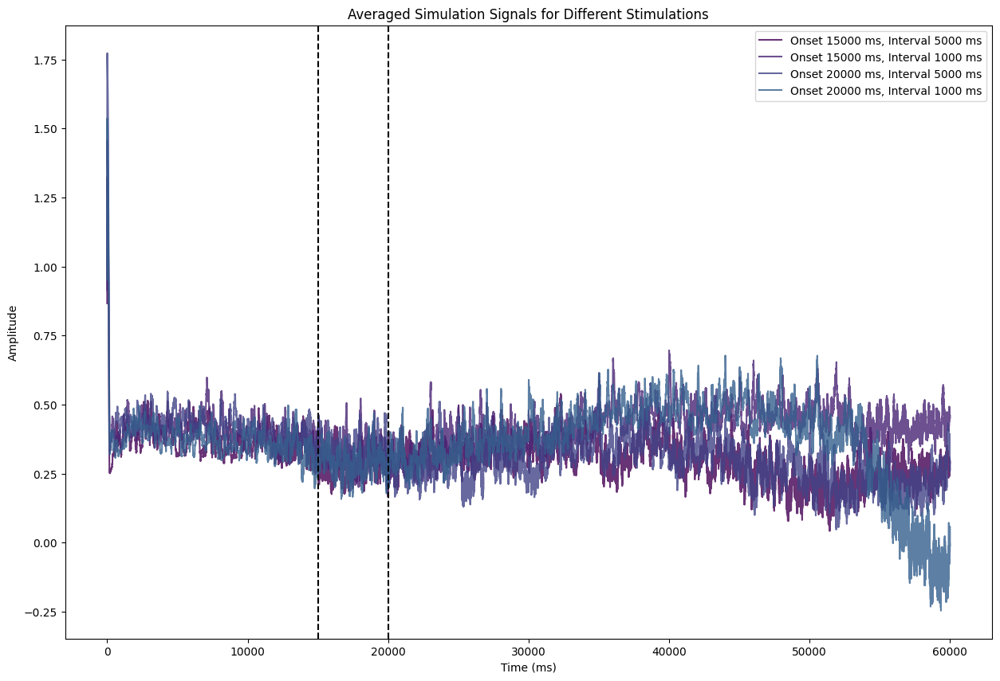

In [137]:
# Assuming 'results' is a dictionary with (onset, interval) keys and simulation data as values
colors = plt.cm.viridis(np.linspace(0, .3, len(results)))  # Use a colormap to generate distinct colors

plt.figure(figsize=(15, 10))  # Create one figure for all plots

for idx, (onset, interval) in enumerate(results):
    sim_data = results[(onset, interval)]
    averaged_data = np.mean(sim_data, axis=2)  # Average across the last axis (electrodes)
    
    plt.plot(averaged_data[:, 0], color=colors[idx], label=f'Onset {onset} ms, Interval {interval} ms', alpha=0.8)

plt.title('Averaged Simulation Signals for Different Stimulations')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.legend(loc='upper right')  # Add a legend to distinguish different simulations

#add vertical lines at stimulus onsets
plt.axvline(x=15000, color='k', linestyle='--')
plt.axvline(x=20000, color='k', linestyle='--')
plt.show()


#shade the duration of the stimulation

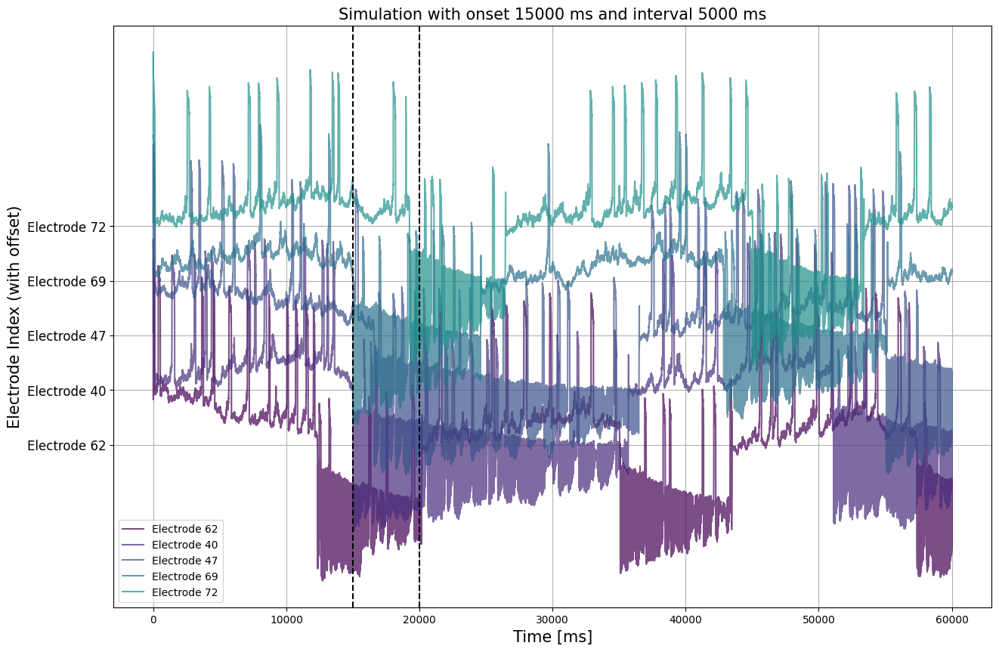

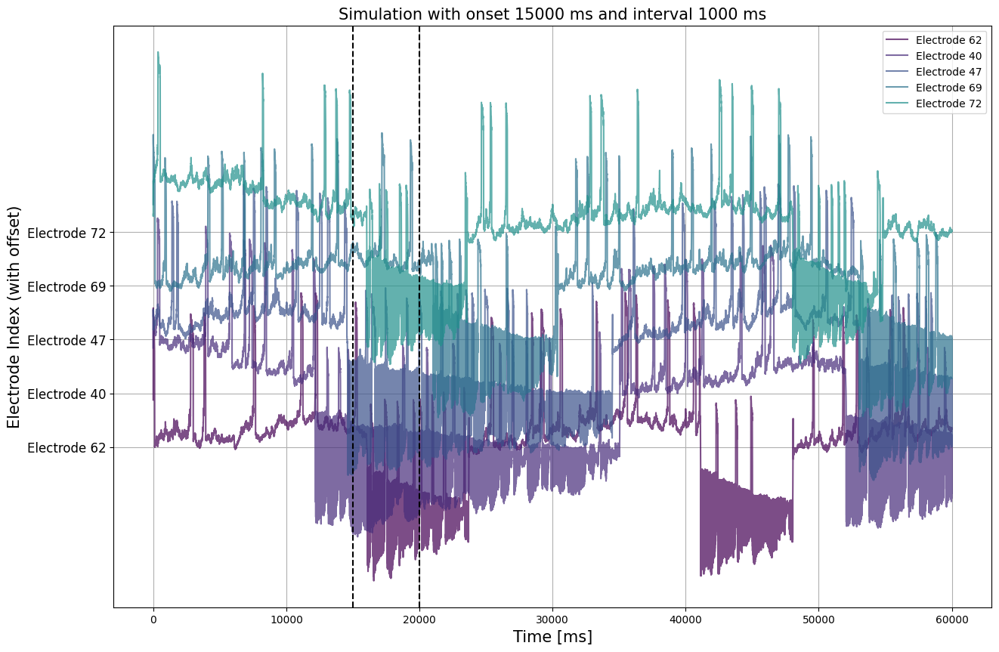

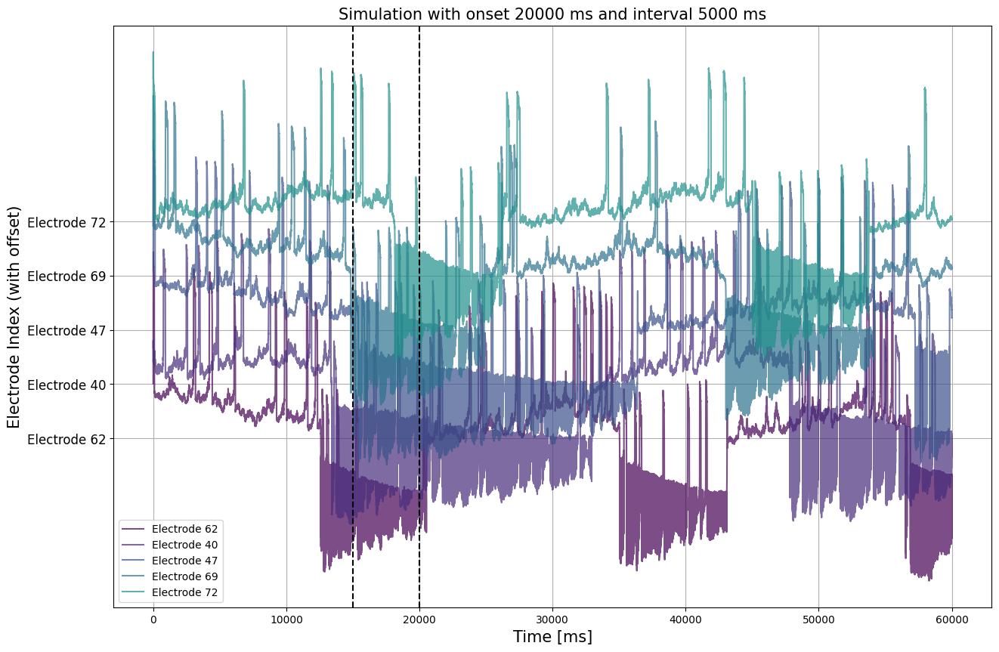

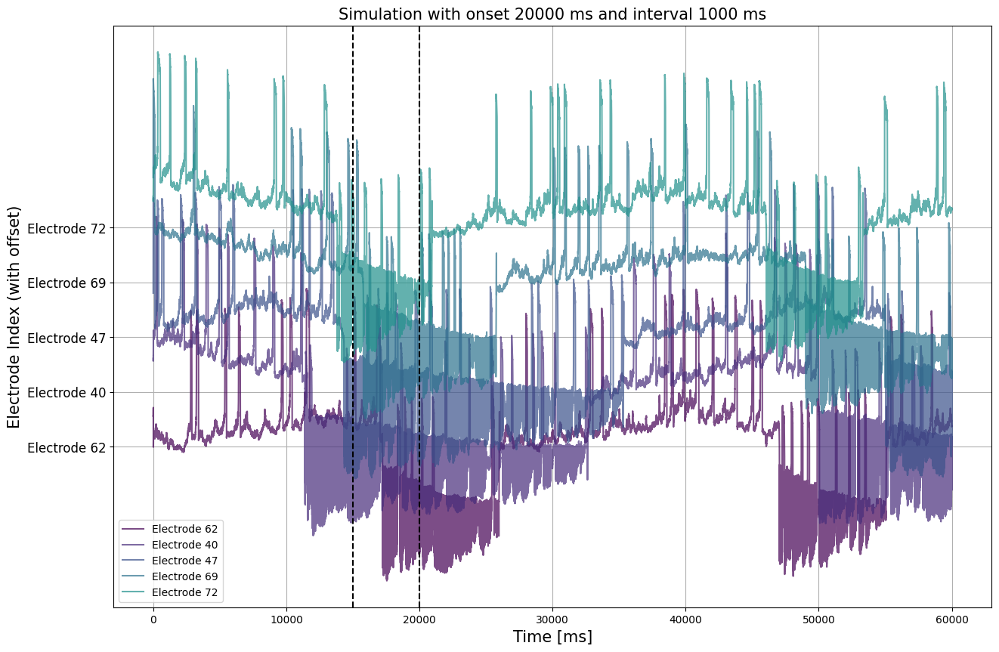

In [138]:
# Assuming 'results' is a dictionary with (onset, interval) keys and simulation data as values
EN = [62, 40, 47, 69, 72]  # Electrode indices
colors = plt.cm.viridis(np.linspace(0, .5, len(EN)))  # Use a colormap to generate distinct colors

for onset, interval in results:
    sim_data = results[(onset, interval)]
    
    plt.figure(figsize=(15, 10))
    
    # Plot data for each electrode with a different color
    for ie, en in enumerate(EN):
        plt.plot(np.arange(0, sim_data.shape[0]), sim_data[:, 0, en] + ie, color=colors[ie], alpha=0.7, label=f'Electrode {en}')
    
    plt.title(f'Simulation with onset {onset} ms and interval {interval} ms', fontsize=15)
    plt.xlabel('Time [ms]', fontsize=15)
    plt.ylabel('Electrode Index (with offset)', fontsize=15)
    plt.yticks(np.arange(len(EN)), [f'Electrode {en}' for en in EN], fontsize=12)  # Label with electrode indices or names
    plt.legend()
    #add vertical lines at stimulus onsets
    plt.axvline(x=15000, color='k', linestyle='--')
    plt.axvline(x=20000, color='k', linestyle='--')
    plt.grid(True)
    plt.show()

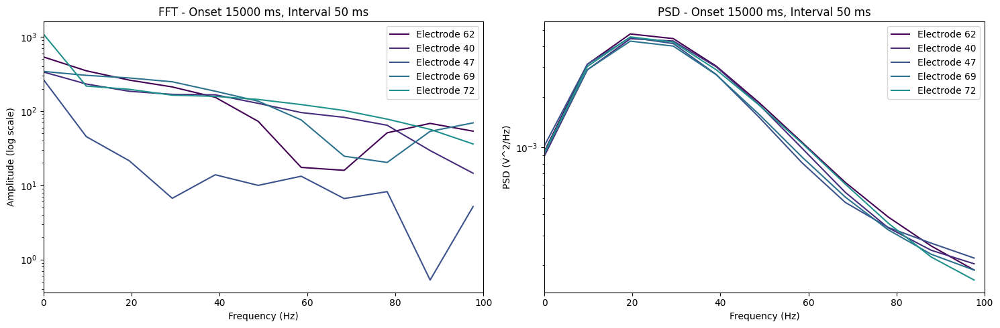

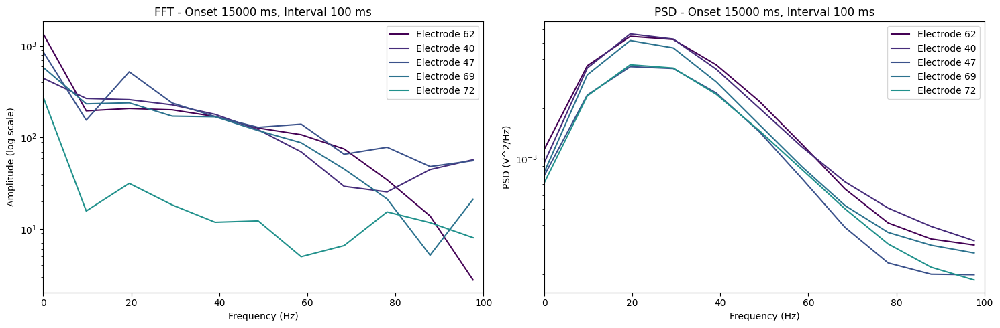

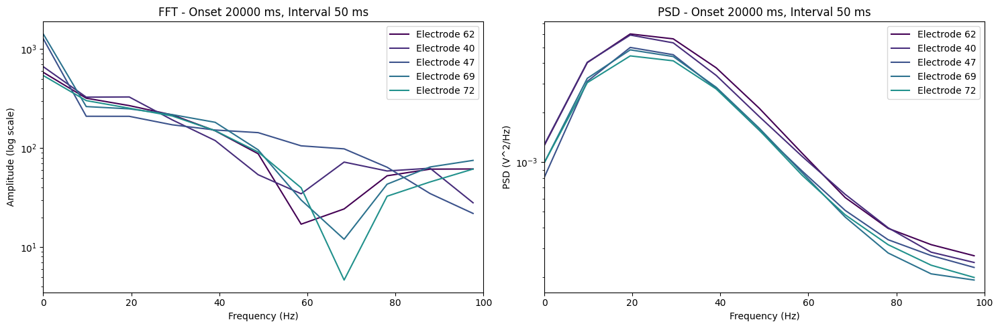

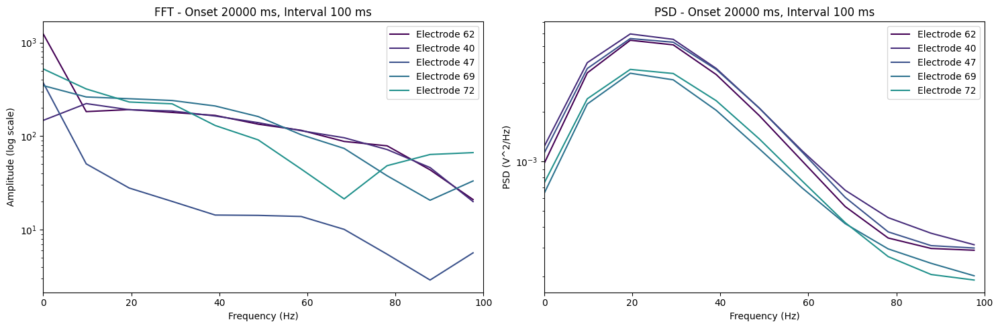

In [ ]:
# Assuming 'results' is a dictionary with (onset, interval) keys and simulation data as values
EN = [62, 40, 47, 69, 72]  # Electrode indices
colors = plt.cm.viridis(np.linspace(0, .5, len(EN)))  # Use a colormap to generate distinct colors

# Iterate through each (onset, interval) combination
for onset, interval in results:
    sim_data = results[(onset, interval)]
    
    # Compute FFT for each electrode and plot
    plt.figure(figsize=(15, 5))
    nfft = 2**10  # FFT points
    dt = 0.1  # Integration step size in ms

    plt.subplot(1, 2, 1)  # FFT Plot
    for ie, en in enumerate(EN):
        electrode_data = sim_data[:, 0, en]
        fft = np.fft.fft(electrode_data, n=nfft)
        freq = np.fft.fftfreq(nfft, d=dt / 1000)  # Convert dt to seconds for FFT

        # Filter frequencies
        pos_freqs = (freq >= 0) & (freq <= 100)
        pos_freqs_fft = fft[pos_freqs]
        pos_freqs_freq = freq[pos_freqs]

        plt.plot(pos_freqs_freq, np.abs(pos_freqs_fft), color=colors[ie], label=f'Electrode {en}')
    plt.yscale('log')  # Log scale for amplitude
    plt.xlim(0, 100)
    plt.title(f'FFT - Onset {onset} ms, Interval {interval} ms')
    plt.ylabel('Amplitude (log scale)')
    plt.xlabel('Frequency (Hz)')
    plt.legend(loc='upper right')

    # Compute PSD using Welch's method and plot
    plt.subplot(1, 2, 2)  # PSD Plot
    for ie, en in enumerate(EN):
        electrode_data = sim_data[:, 0, en]
        freqs, psd = welch(electrode_data, fs=1 / (dt / 1000), nperseg=nfft//2, noverlap=nfft//4, nfft=nfft)

        # Filter PSD frequencies
        psd_range = freqs <= 100
        freqs = freqs[psd_range]
        psd = psd[psd_range]

        plt.semilogy(freqs, psd, color=colors[ie], label=f'Electrode {en}')
    plt.xlim(0, 100)
    plt.title(f'PSD - Onset {onset} ms, Interval {interval} ms')
    plt.ylabel('PSD (V^2/Hz)')
    plt.xlabel('Frequency (Hz)')
    plt.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

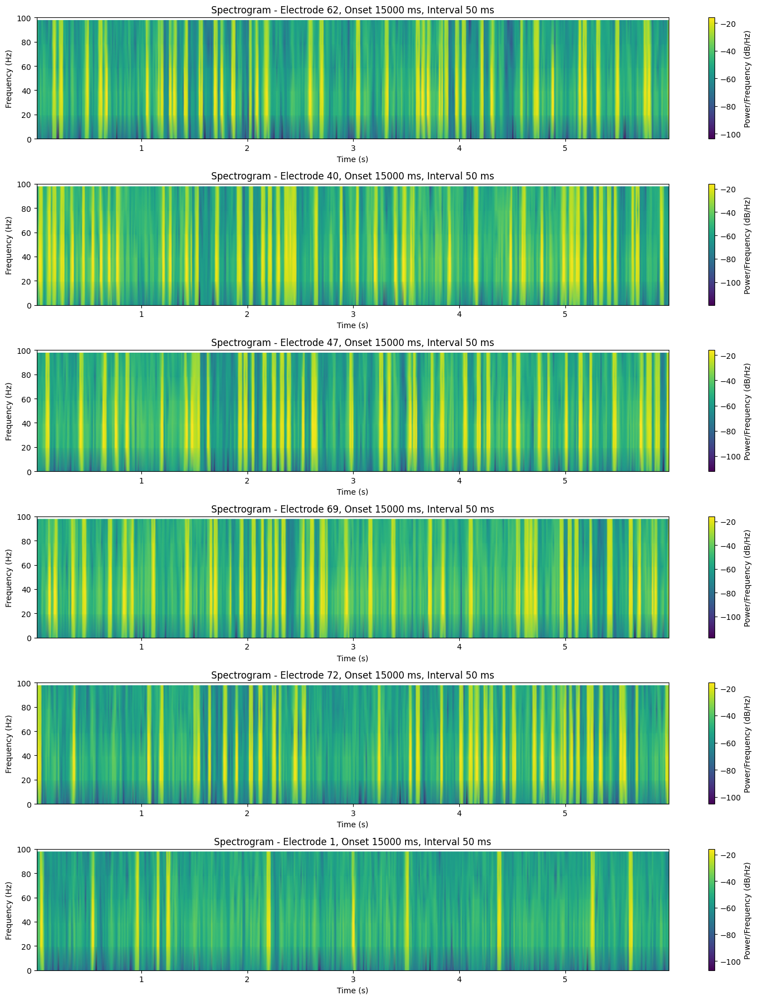

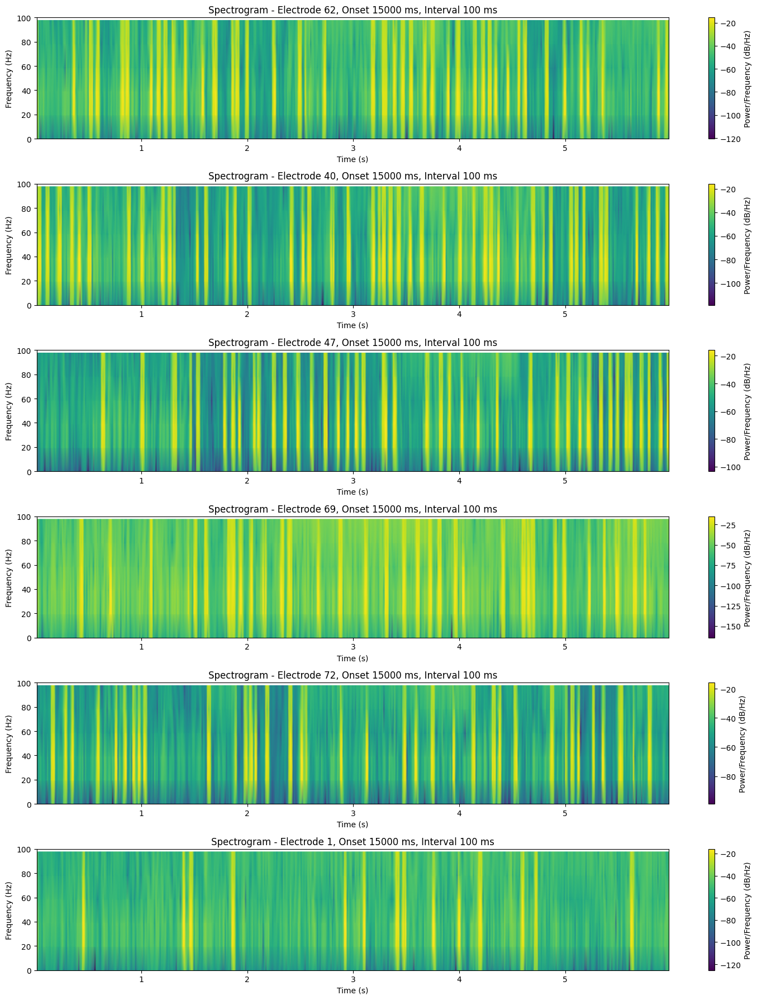

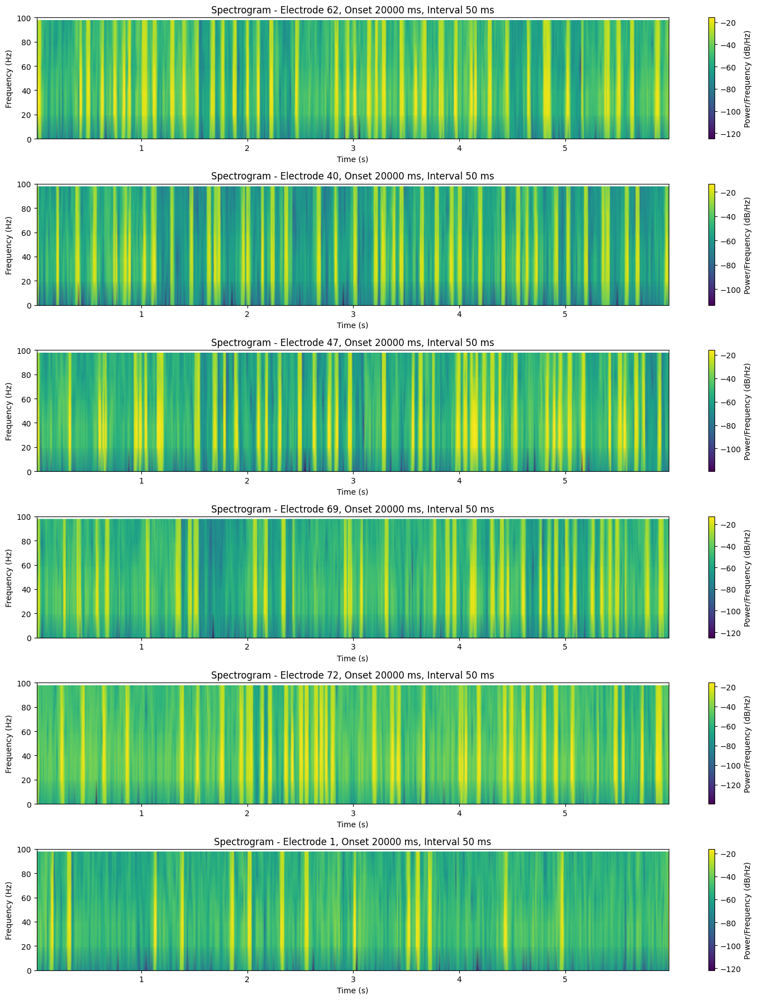

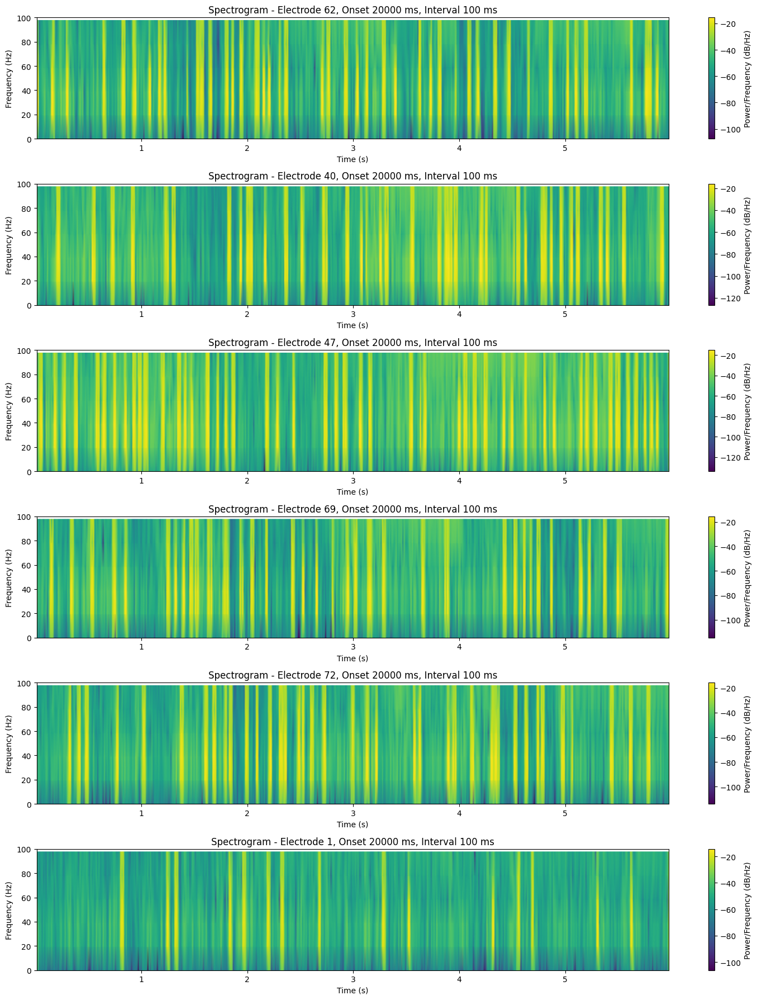

In [121]:
# Iterate through each (onset, interval) combination
for onset, interval in results:
    sim_data = results[(onset, interval)]
    
    # Create a figure for the spectrogram heatmaps
    plt.figure(figsize=(15, len(EN) * 3))

    # Plot spectrogram heatmaps for each electrode
    for ie, en in enumerate(EN):
        electrode_data = sim_data[:, 0, en]
        fs = 1 / (dt / 1000)  # Sampling frequency in Hz
        f, t, Sxx = spectrogram(electrode_data, fs=fs, nperseg=256, noverlap=128, nfft=512)

        # Filter frequencies
        valid_freqs = f <= 100
        f = f[valid_freqs]
        Sxx = Sxx[valid_freqs, :]

        plt.subplot(len(EN), 1, ie + 1)
        plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud', cmap='viridis')
        plt.colorbar(label='Power/Frequency (dB/Hz)')
        plt.title(f'Spectrogram - Electrode {en}, Onset {onset} ms, Interval {interval} ms')
        plt.ylabel('Frequency (Hz)')
        plt.xlabel('Time (s)')
        plt.ylim([0, 100])  # Limit to 0-100 Hz

    plt.tight_layout()
    plt.show()

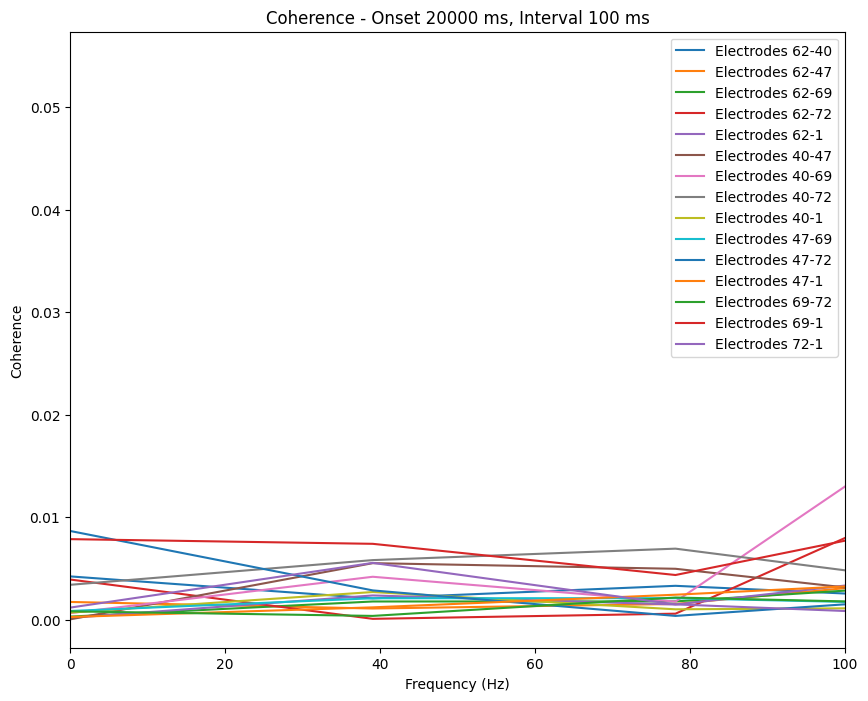

In [123]:
from scipy.signal import coherence

plt.figure(figsize=(10, 8))
for i in range(len(EN)):
    for j in range(i + 1, len(EN)):
        f, Cxy = coherence(sim_data[:, 0, EN[i]], sim_data[:, 0, EN[j]], fs=1 / (dt / 1000), nperseg=256)
        plt.plot(f, Cxy, label=f'Electrodes {EN[i]}-{EN[j]}')
plt.xlim(0, 100)
plt.title(f'Coherence - Onset {onset} ms, Interval {interval} ms')
plt.ylabel('Coherence')
plt.xlabel('Frequency (Hz)')
plt.legend(loc='upper right')
plt.show()


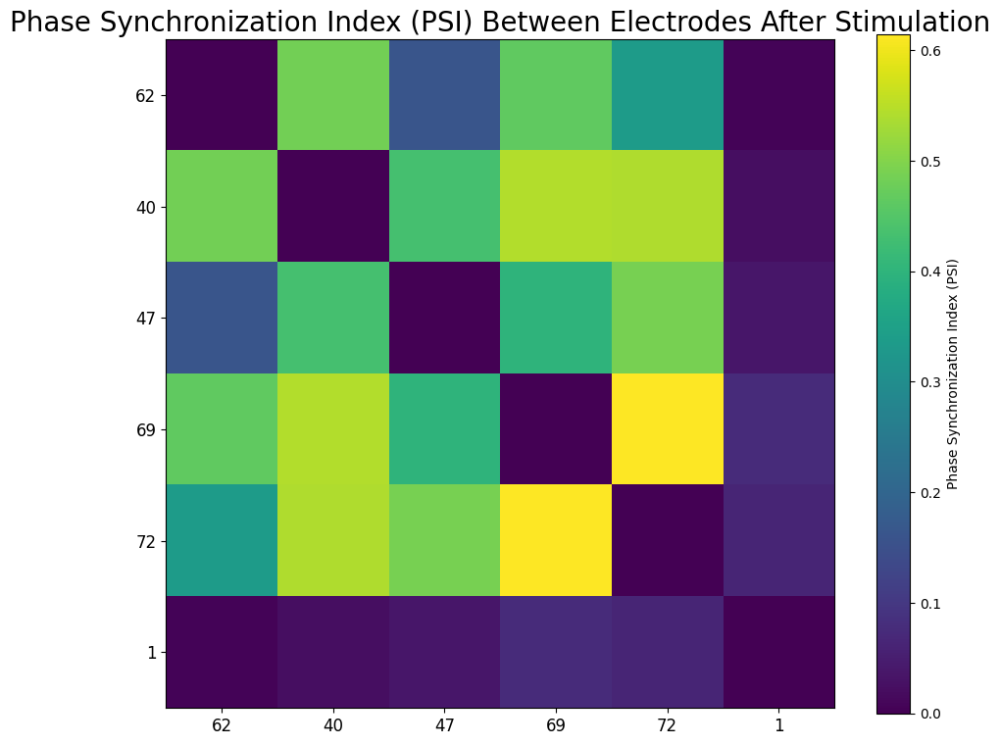

In [131]:
from scipy.signal import hilbert

def phase_synchronization(signal1, signal2):
    phase1 = np.angle(hilbert(signal1))
    phase2 = np.angle(hilbert(signal2))
    psi = np.abs(np.mean(np.exp(1j * (phase1 - phase2))))
    return psi

psi_values = []
electrode_pairs = []
for i in range(len(EN)):
    for j in range(i + 1, len(EN)):
        psi = phase_synchronization(sim_data[:, 0, EN[i]], sim_data[:, 0, EN[j]])
        psi_values.append(psi)
        electrode_pairs.append(f'{EN[i]}-{EN[j]}')

plt.figure(figsize=(10, 6))
plt.bar(electrode_pairs, psi_values, color='skyblue')
plt.title(f'Phase Synchronization Index (PSI) - Onset {onset} ms, Interval {interval} ms')
plt.ylabel('PSI')
plt.xlabel('Electrode Pairs')
plt.show()


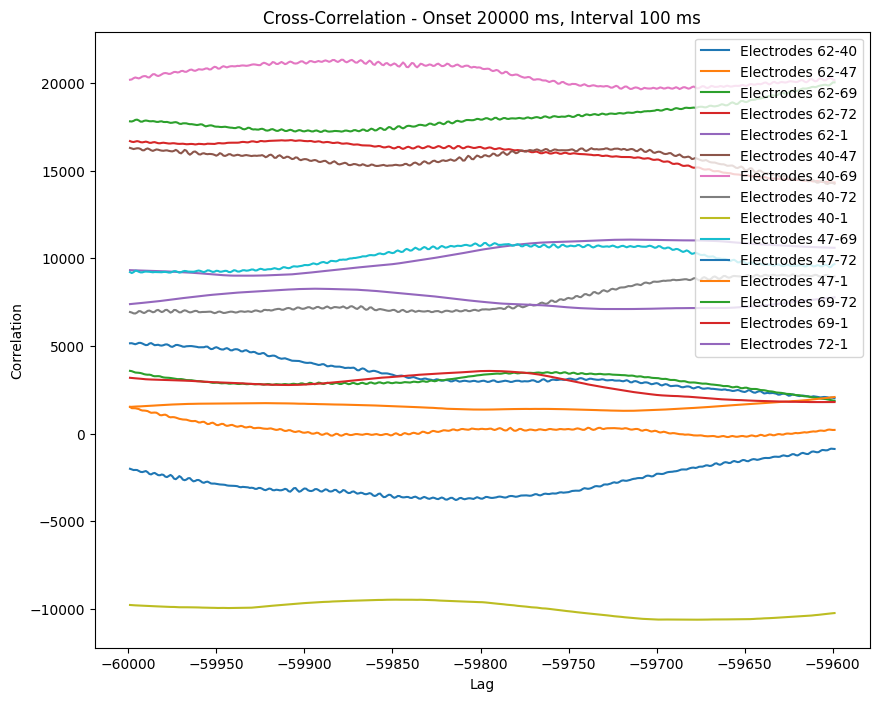

In [125]:
from scipy.signal import correlate

plt.figure(figsize=(10, 8))
max_lag = 200  # Maximum lag in samples
for i in range(len(EN)):
    for j in range(i + 1, len(EN)):
        corr = correlate(sim_data[:, 0, EN[i]], sim_data[:, 0, EN[j]], mode='full', method='auto')
        lags = np.arange(-len(sim_data[:, 0, EN[i]]) + 1, len(sim_data[:, 0, EN[i]]))
        plt.plot(lags[:2*max_lag+1], corr[len(corr)//2 - max_lag:len(corr)//2 + max_lag + 1], label=f'Electrodes {EN[i]}-{EN[j]}')
plt.title(f'Cross-Correlation - Onset {onset} ms, Interval {interval} ms')
plt.ylabel('Correlation')
plt.xlabel('Lag')
plt.legend(loc='upper right')
plt.show()

#band pass for each one

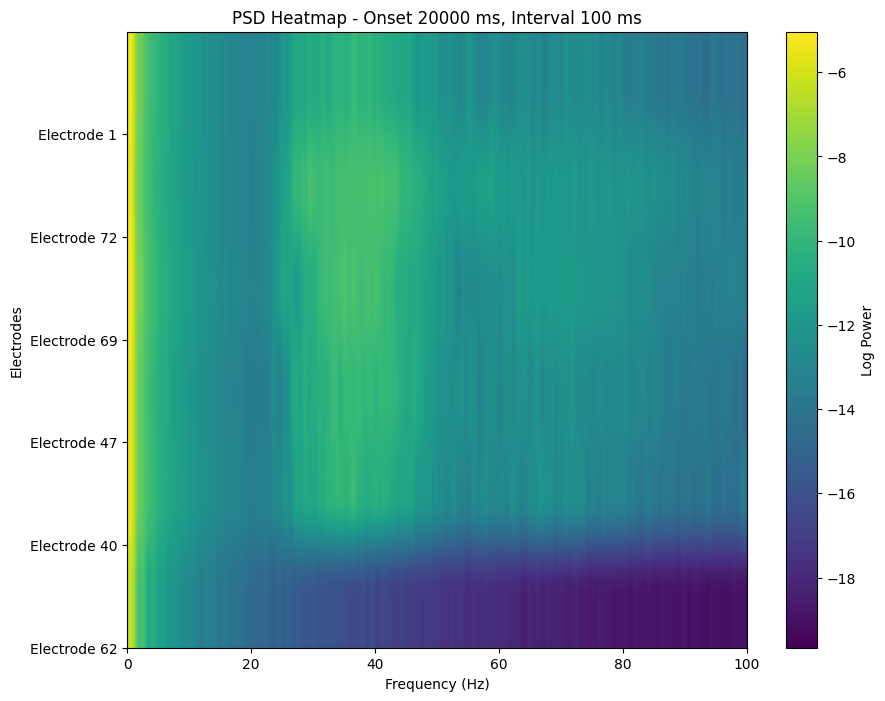

In [126]:
plt.figure(figsize=(10, 8))
psd_all = []
for ie, en in enumerate(EN):
    freqs, psd = welch(sim_data[:, 0, en], fs=1 / (dt / 1000), nperseg=nfft//2, noverlap=nfft//4, nfft=nfft)
    psd_all.append(psd)

plt.imshow(np.log(np.array(psd_all)), aspect='auto', cmap='viridis', extent=[0, 100, 0, len(EN)])
plt.colorbar(label='Log Power')
plt.yticks(np.arange(len(EN)), labels=[f'Electrode {en}' for en in EN])
plt.title(f'PSD Heatmap - Onset {onset} ms, Interval {interval} ms')
plt.ylabel('Electrodes')
plt.xlabel('Frequency (Hz)')
plt.show()

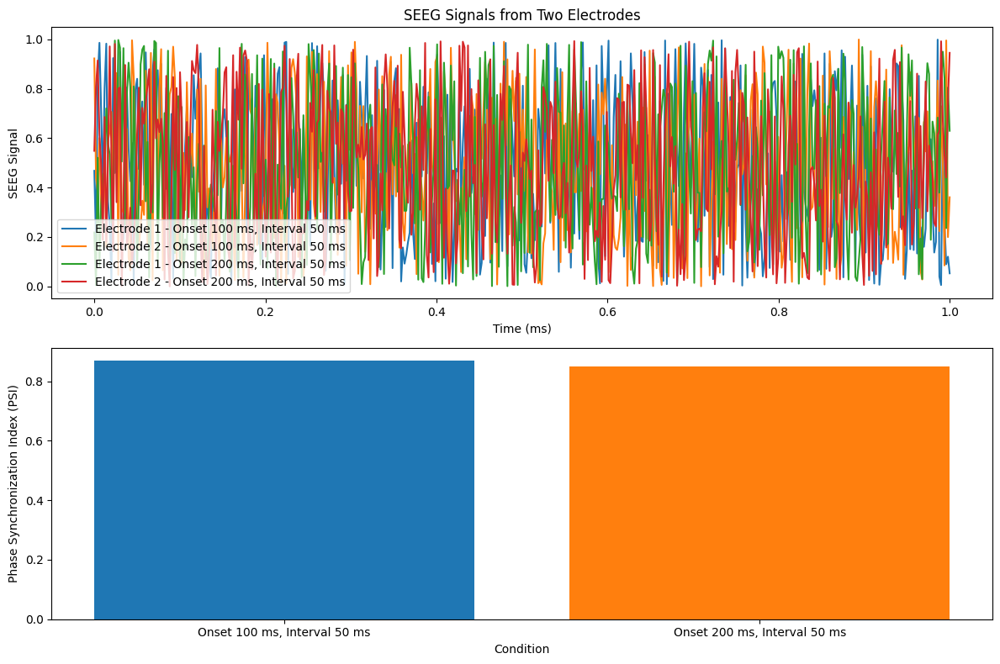

In [135]:
# Function to calculate phase synchronization
def calculate_phase_synchronization(signal1, signal2):
    # Calculate the analytic signal (Hilbert transform) for each signal
    analytic_signal1 = hilbert(signal1)
    analytic_signal2 = hilbert(signal2)
    
    # Extract the instantaneous phase
    phase1 = np.angle(analytic_signal1)
    phase2 = np.angle(analytic_signal2)
    
    # Calculate phase difference
    phase_diff = np.abs(phase1 - phase2)
    
    # Calculate phase synchronization index (PSI)
    psi = np.abs(np.mean(np.exp(1j * phase_diff)))
    
    return psi


# Plot results and calculate phase synchronization
plt.figure(figsize=(12, 8))
for onset, interval, ttavg, tavg, tseeg, seeg in results:
    electrode1_signal = seeg[:, 0, 0, 0]  # First electrode
    electrode2_signal = seeg[:, 0, 1, 0]  # Second electrode
    
    # Plot the signals
    plt.subplot(2, 1, 1)
    plt.plot(ttavg, electrode1_signal, label=f'Electrode 1 - Onset {onset} ms, Interval {interval} ms')
    plt.plot(ttavg, electrode2_signal, label=f'Electrode 2 - Onset {onset} ms, Interval {interval} ms')
    plt.legend()
    plt.title('SEEG Signals from Two Electrodes')
    plt.ylabel("SEEG Signal")
    plt.xlabel('Time (ms)')
    
    # Calculate and plot phase synchronization
    psi = calculate_phase_synchronization(electrode1_signal, electrode2_signal)
    plt.subplot(2, 1, 2)
    plt.bar(f'Onset {onset} ms, Interval {interval} ms', psi)
    plt.ylabel('Phase Synchronization Index (PSI)')
    plt.xlabel('Condition')

plt.tight_layout()
plt.show()



### Ideas for incorporating machine learning: 

#### Predictive Modeling for Seizure Onset and Response:
Use supervised learning with labeled data (seizure onset times and corresponding stimulation responses). Techniques like support vector machines, random forests, or neural networks could be used to predict the likelihood of a seizure or the effectiveness of a specific stimulation.

#### Optimization of Stimulation Parameters:

* Reinforcement learning can be applied to iteratively improve stimulation strategies. The RL agent would learn the optimal stimulation policy by maximizing a reward function based on seizure suppression.

#### Pattern Recognition inSEEG Signals:

* Convolutional or Recurrent Neural Networks could be trained to detect patterns in time-series data. Unsupervised learning techniques like clustering might also help to discover novel patterns associated with seizure states.

#### Phase Synchronization Analysis:

Use ML algorithms to analyze phase synchronization metrics and their evolution over time. Clustering methods might help identify different synchronization states, and predictive models can forecast changes in synchronization due to stimulation.

#### Time-Series Forecasting:

* Implement time-series forecasting models through LSTM networks to anticipate seizure onset and progression.


closed feedback loop system 

choose a lobe

surgical resection